# Detection and Classification fruits: Apple Varieties

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
cd /content/drive/MyDrive/Nghiên cứu khoa học/Apple-Varieties-classification/apple_dataset-main

/content/drive/MyDrive/Nghiên cứu khoa học/Apple-Varieties-classification/apple_dataset-main


In [ ]:
!ls -a

GreenApple  input_1.png  input_2.png  input_3.png  RedApple


## Steps
1. Download dataset from kaggle using `opendataset`
2. Pre-processing data from dataset
3. Split dataset into train data and test data
4. Build `CustomDataset` class
5. Build `transforms`
6. Convert data to `Dataloader`
7. Select/Build neural network
8. Test model and `CustomDataset`
9. Build train and test function
10. Select loss function and optimizer
11. Train model
12. Evaluate model
13. Train with diffrent neural network.
14. Deploy
  - https://neptune.ai/blog/optimizing-models-for-deployment-and-inference
  - https://pytorch.org/vision/main/models/resnet_quant.html

## Step 1: Download dataset




In [ ]:
def is_dir_empty(dir_path):
  return not any(dir_path.iterdir())

In [ ]:
from pathlib import Path
root_path = Path('/content/drive/MyDrive/Nghiên cứu khoa học/Apple-Varieties-classification')
image_path = root_path / 'apple_dataset-main'

## Step 2: Prep-processing data

In [ ]:
import os
def walk_through_dir(dir_path):
  image_paths = []
  for dir_path, dir_names, file_names in os.walk(dir_path):
    if file_names:
      print(f'There are {len(dir_names)} directories and {len(file_names)} images in {dir_path}')
      for file_name in file_names:
        path = os.path.join(dir_path, file_name)
        image_paths.append(path)
  return image_paths

In [ ]:
image_path_list = walk_through_dir(image_path)

There are 0 directories and 223 images in /content/drive/MyDrive/Nghiên cứu khoa học/Apple-Varieties-classification/apple_dataset-main/RedApple
There are 0 directories and 128 images in /content/drive/MyDrive/Nghiên cứu khoa học/Apple-Varieties-classification/apple_dataset-main/GreenApple


In [ ]:
image_path_list[:10]

['/content/drive/MyDrive/Nghiên cứu khoa học/Apple-Varieties-classification/apple_dataset-main/RedApple/IMG_1219.JPG',
 '/content/drive/MyDrive/Nghiên cứu khoa học/Apple-Varieties-classification/apple_dataset-main/RedApple/IMG_1269.JPG',
 '/content/drive/MyDrive/Nghiên cứu khoa học/Apple-Varieties-classification/apple_dataset-main/RedApple/IMG_1214.JPG',
 '/content/drive/MyDrive/Nghiên cứu khoa học/Apple-Varieties-classification/apple_dataset-main/RedApple/IMG_1692.JPG',
 '/content/drive/MyDrive/Nghiên cứu khoa học/Apple-Varieties-classification/apple_dataset-main/RedApple/IMG_1217.JPG',
 '/content/drive/MyDrive/Nghiên cứu khoa học/Apple-Varieties-classification/apple_dataset-main/RedApple/IMG_1222.JPG',
 '/content/drive/MyDrive/Nghiên cứu khoa học/Apple-Varieties-classification/apple_dataset-main/RedApple/IMG_1221.JPG',
 '/content/drive/MyDrive/Nghiên cứu khoa học/Apple-Varieties-classification/apple_dataset-main/RedApple/IMG_1709.JPG',
 '/content/drive

In [ ]:
len(image_path_list)

351

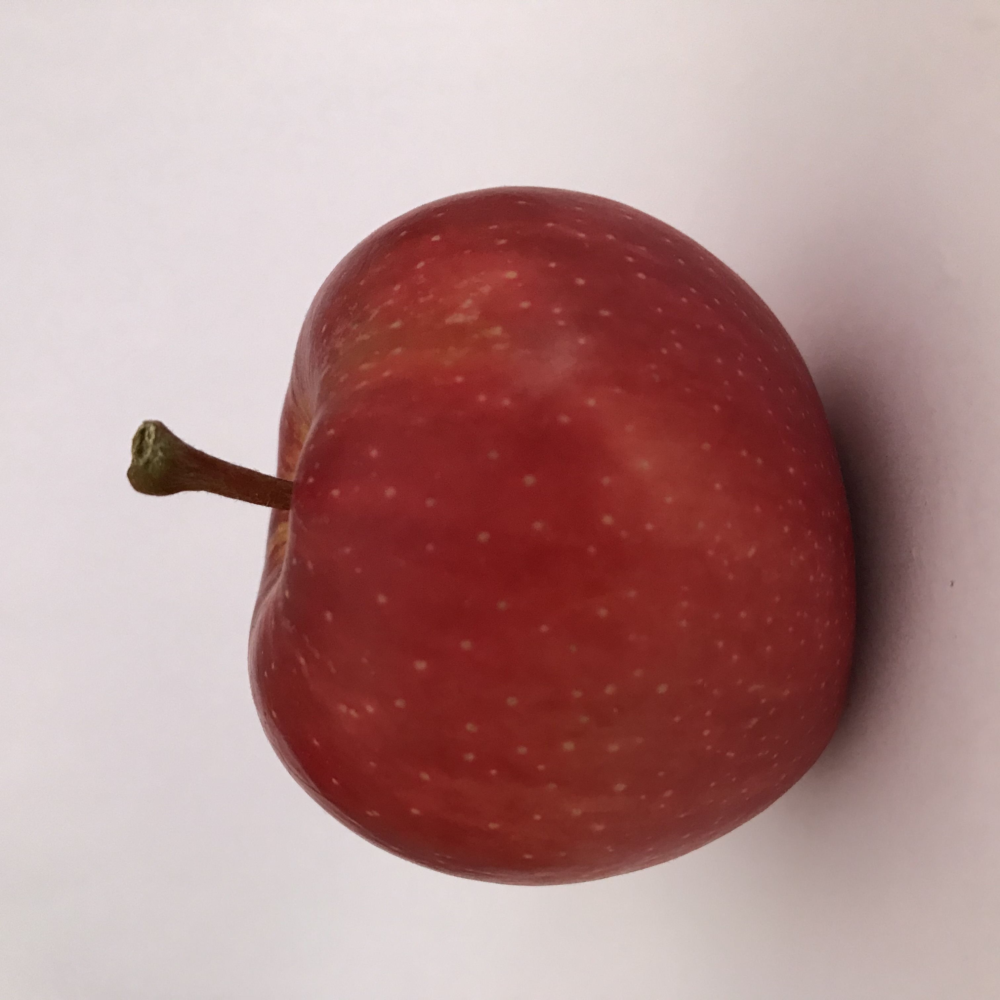

In [ ]:
from PIL import Image

image = Image.open(image_path_list[1])
image

In [ ]:
def find_classes(target_dir):
    classes = sorted(entry.name for entry in os.scandir(target_dir) if entry.is_dir())
    if not classes:
      raise FileNotFoundError(f"Couldn't find any class name in {target_dir}, please check your input dir!")
    cls_to_idx = {cls_name: idx for idx, cls_name in enumerate(classes)}
    return cls_to_idx

class_names = find_classes(image_path)
class_names.values(), class_names.keys()

(dict_values([0, 1]), dict_keys(['GreenApple', 'RedApple']))

In [ ]:
Path(image_path_list[1]).parent.stem

'RedApple'

## Split test and train sets

In [ ]:
class_dict = {}
for img_path in image_path_list:
    # Lấy tên lớp từ đường dẫn, ví dụ: 'Golden', 'Galaval', ...
    class_name = os.path.basename(os.path.dirname(img_path))
    if class_name not in class_dict:
        class_dict[class_name] = []
    class_dict[class_name].append(img_path)

In [ ]:
class_dict.keys()

dict_keys(['RedApple', 'GreenApple'])

In [ ]:
import random
# Chia các lớp thành tập train và test
train_paths = []
test_paths = []

for class_name, paths in class_dict.items():
    random.shuffle(paths)  # Xáo trộn danh sách đường dẫn
    train_size = int(0.8 * len(paths))  # 80% cho train
    train_paths.extend(paths[:train_size])
    test_paths.extend(paths[train_size:])

In [ ]:
train_paths[-10:], test_paths[-10:]

(['/content/drive/MyDrive/Nghiên cứu khoa học/Apple-Varieties-classification/apple_dataset-main/GreenApple/Screen Shot 2018-06-08 at 5.04.42 PM.png',
  '/content/drive/MyDrive/Nghiên cứu khoa học/Apple-Varieties-classification/apple_dataset-main/GreenApple/Screen Shot 2018-06-08 at 5.11.35 PM.png',
  '/content/drive/MyDrive/Nghiên cứu khoa học/Apple-Varieties-classification/apple_dataset-main/GreenApple/Screen Shot 2018-06-08 at 5.26.58 PM.png',
  '/content/drive/MyDrive/Nghiên cứu khoa học/Apple-Varieties-classification/apple_dataset-main/GreenApple/IMG_1191.JPG',
  '/content/drive/MyDrive/Nghiên cứu khoa học/Apple-Varieties-classification/apple_dataset-main/GreenApple/Screen Shot 2018-06-08 at 5.02.24 PM.png',
  '/content/drive/MyDrive/Nghiên cứu khoa học/Apple-Varieties-classification/apple_dataset-main/GreenApple/Screen Shot 2018-06-08 at 5.27.06 PM.png',
  '/content/drive/MyDrive/Nghiên cứu khoa học/Apple-Varieties-classification/apple_dataset-main/Gree

In [ ]:
Path(train_paths[10]).parent.name

'RedApple'

## Step 4: Build `transform`

In [ ]:
import torch
from torch.utils.data import Dataset
from torchvision import transforms
from PIL import Image
import os
from pathlib import Path

In [ ]:
# transform = transforms.Compose([
#     transforms.Resize(256),
#     transforms.CenterCrop(224),
#     transforms.ToTensor(),
#     transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
# ])
transform = transforms.Compose([
    transforms.RandomHorizontalFlip(),
    transforms.RandomRotation(15),
    transforms.Resize(256),
    transforms.CenterCrop(224),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])

## Step 5: Build `FruitsDataset` class

In [ ]:
class AppleDataset(Dataset):
  def __init__(self, paths, transformer:transforms=None):
    self.image_paths = paths
    self.transform = transformer
    self.classes, self.cls_to_idx = self._find_classes(paths)

  def _find_classes(self, paths):
    class_names = [Path(p).parent.name for p in paths]
    classes = sorted(set(class_names))
    cls_to_idx = {cls_name: idx for idx, cls_name in enumerate(classes)}
    return classes, cls_to_idx

  def _load_image(self, index):
    image = Image.open(self.image_paths[index])
    return image.convert('RGB')

  def __len__(self):
    return len(self.image_paths)

  def __getitem__(self, index):
    image = self._load_image(index)
    class_name = Path(self.image_paths[index]).parent.name
    cls_to_idx = self.cls_to_idx[class_name]
    if self.transform:
      image = self.transform(image)
    return image, cls_to_idx

## Test `FruitsDataset`

In [ ]:
train_data = AppleDataset(train_paths, transformer=transform)
test_data = AppleDataset(test_paths, transformer=transform)

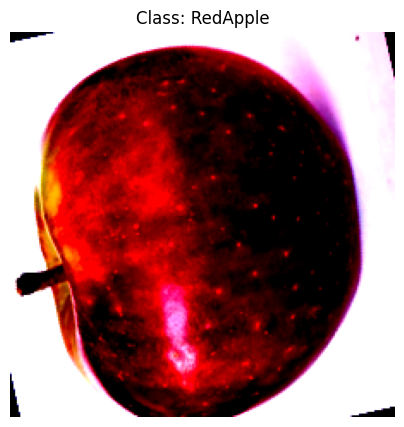

In [ ]:
import matplotlib.pyplot as plt
import random

random_idx = random.randint(0, len(train_data))
image, cls_to_idx = train_data[random_idx]

plt.figure(figsize=(5, 5))
plt.imshow(image.permute(1,2,0))
plt.title(f'Class: {train_data.classes[cls_to_idx]}')
plt.axis('off')
plt.show()

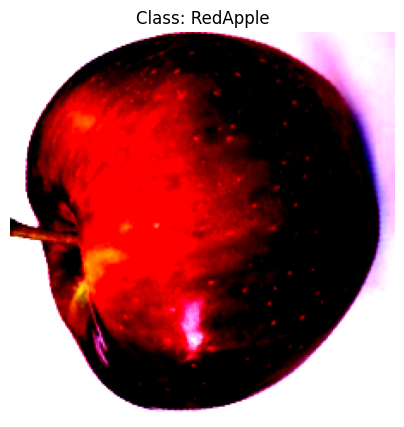

In [ ]:
import matplotlib.pyplot as plt
import random

random_idx = random.randint(0, len(test_data))
image, cls_to_idx = train_data[random_idx]

plt.figure(figsize=(5, 5))
plt.imshow(image.permute(1,2,0))
plt.title(f'Class: {train_data.classes[cls_to_idx]}')
plt.axis('off')
plt.show()

In [ ]:
train_data.classes, train_data.classes.__len__()

(['GreenApple', 'RedApple'], 2)

In [ ]:
test_data.classes, test_data.classes.__len__()

(['GreenApple', 'RedApple'], 2)

## Step 6: Convert data to Dataloader

In [ ]:
from torch.utils.data import DataLoader

batch_size = 32
num_workers = 2

train_dataloader = DataLoader(dataset=train_data, batch_size=batch_size, shuffle=True, num_workers=num_workers)
test_dataloader = DataLoader(dataset=test_data, batch_size=batch_size, num_workers=num_workers)

Image shape: torch.Size([32, 3, 224, 224]), label: torch.Size([32])


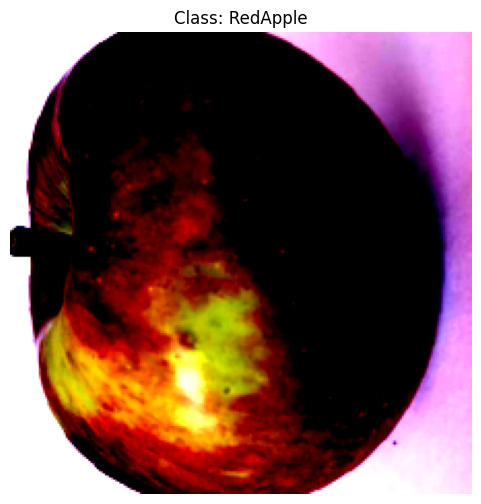

In [ ]:
image, label = next(iter(train_dataloader))
print(f'Image shape: {image.shape}, label: {label.shape}')

plt.figure(figsize=(6,6))
plt.imshow(torch.permute(image[0], (1,2,0)))
plt.title(f'Class: {train_data.classes[label[0]]}')
plt.axis('off')
plt.show()

## Step 7: Select neural network
We will use restnet50, See more in https://pytorch.org/hub/nvidia_deeplearningexamples_resnet50/

In [ ]:
!pip install -q torchinfo

In [ ]:
import torch
import torchvision.models as models
from torchinfo import summary

device = 'cuda' if torch.cuda.is_available() else 'cpu'
device

'cuda'

In [ ]:
# # prompt: torch load

# model = models.resnet50(pretrained=True)
# num_ftrs = model.fc.in_features
# # Here the size of each output sample is set to 2.
# # Alternatively, it can be generalized to nn.Linear(num_ftrs, len(class_names)).
# model.fc = torch.nn.Linear(num_ftrs, len(train_data.classes))
# model = model.to(device)
# summary(model, input_size=(1, 3, 224, 224))

# # Load the model
# checkpoint_path = '/content/drive/MyDrive/Nghiên cứu khoa học/Apple-Varieties-classification/model_apple_classification.pth'
# if os.path.exists(checkpoint_path):
#   model.load_state_dict(torch.load(checkpoint_path))
#   print('Load model success!')
# else:
#   print('Model not found!')

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/resnet50-0676ba61.pth" to /root/.cache/torch/hub/checkpoints/resnet50-0676ba61.pth
100%|██████████| 97.8M/97.8M [00:01<00:00, 73.5MB/s]


Model not found!


In [ ]:
pretrain_url = "https://download.pytorch.org/models/resnet50-11ad3fa6.pth"
# # Download the weights
state_dict = torch.hub.load_state_dict_from_url(pretrain_url, progress=True)

# Load the ResNet-50 model
model_resnet50 = models.resnet50()
model_resnet50.load_state_dict(state_dict)

# Modify the fully connected layer to have 2 output: Apples and Oranges, in the future, we will add more one output is background or all more one model to classifier object from background
num_ftrs = model_resnet50.fc.in_features
model_resnet50.fc = torch.nn.Linear(num_ftrs, train_data.classes.__len__())

# model_resnet50.load_state_dict(torch.load('/content/drive/MyDrive/Classification_Apple_vs_Orange/models/resnet50_model.pth'))
model_resnet50.to(device)

summary(model_resnet50, (32, 3, 256, 256))

Downloading: "https://download.pytorch.org/models/resnet50-11ad3fa6.pth" to /root/.cache/torch/hub/checkpoints/resnet50-11ad3fa6.pth
100%|██████████| 97.8M/97.8M [00:00<00:00, 210MB/s]


Layer (type:depth-idx)                   Output Shape              Param #
ResNet                                   [32, 2]                   --
├─Conv2d: 1-1                            [32, 64, 128, 128]        9,408
├─BatchNorm2d: 1-2                       [32, 64, 128, 128]        128
├─ReLU: 1-3                              [32, 64, 128, 128]        --
├─MaxPool2d: 1-4                         [32, 64, 64, 64]          --
├─Sequential: 1-5                        [32, 256, 64, 64]         --
│    └─Bottleneck: 2-1                   [32, 256, 64, 64]         --
│    │    └─Conv2d: 3-1                  [32, 64, 64, 64]          4,096
│    │    └─BatchNorm2d: 3-2             [32, 64, 64, 64]          128
│    │    └─ReLU: 3-3                    [32, 64, 64, 64]          --
│    │    └─Conv2d: 3-4                  [32, 64, 64, 64]          36,864
│    │    └─BatchNorm2d: 3-5             [32, 64, 64, 64]          128
│    │    └─ReLU: 3-6                    [32, 64, 64, 64]          --
│ 

In [ ]:
next(model_resnet50.parameters()).device

device(type='cuda', index=0)

## Step 8: Test model and `CustomDataset`

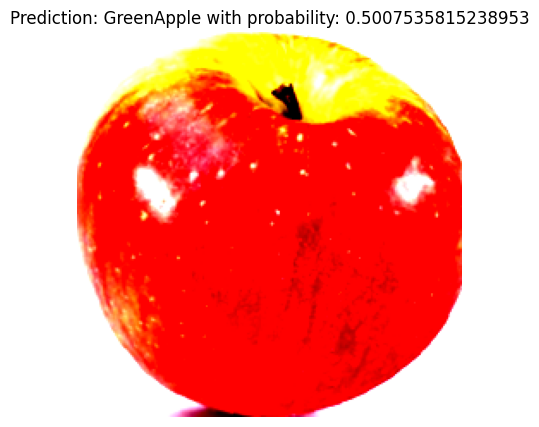

In [ ]:
model_resnet50.eval()
image, label = test_data[10]
image = image.unsqueeze(0).to(device)
with torch.inference_mode():
  y_preds = model_resnet50(image)
  prob = torch.softmax(y_preds, dim=1).max().cpu()
  cls_to_idx = torch.argmax(torch.softmax(y_preds, dim=1), dim=1)

  title = f'Prediction: {train_data.classes[cls_to_idx]} with probability: {prob}'

plt.figure(figsize=(5, 5))
plt.imshow(image.squeeze().permute(1,2,0).cpu())
plt.title(title)
plt.axis(False)
plt.show()

## Step 9: Build `train_step`, `test_step` and `train` function

In [ ]:
from tqdm import tqdm
from timeit import default_timer as timer

In [ ]:
def train_step(model: torch.nn.Module,
               dataloader: torch.utils.data.DataLoader,
               optimizer, loss_fn, device):
  model.train()
  train_loss, train_acc = 0, 0

  for batch, (X, y) in enumerate(dataloader):
    X, y = X.to(device), y.to(device)
    # Forward pass
    y_pred = model(X)
    # Calculate loss
    loss = loss_fn(y_pred, y)
    train_loss += loss.item()
    correct = (torch.argmax(torch.softmax(y_pred, dim=1), dim=1) == y).sum().item()
    train_acc += correct / len(y)
    # Optimizer zero gradient
    optimizer.zero_grad()
    # Backward
    loss.backward()
    # Update weights
    optimizer.step()
  train_loss /= len(dataloader)
  train_acc /= len(dataloader)
  return train_loss, train_acc * 100

In [ ]:
def test_step(model: torch.nn.Module,
              dataloader: torch.utils.data.DataLoader,
              loss_fn, device):
  model.eval()
  test_loss, test_acc = 0, 0
  with torch.inference_mode():
    for X, y in dataloader:
      X, y = X.to(device), y.to(device)
      y_pred = model(X)
      loss = loss_fn(y_pred, y)
      test_loss += loss.item()
      correct = (torch.argmax(torch.softmax(y_pred, dim=1), dim=1) == y).sum().item()
      test_acc += correct / len(y)
    test_loss /= len(dataloader)
    test_acc /= len(dataloader)
  return test_loss, test_acc * 100

In [ ]:
def train(model, train_dataloader, test_dataloader, epochs, lr, device):
  optimizer = torch.optim.Adam(model.parameters(), lr=lr)
  loss_fn = torch.nn.CrossEntropyLoss()

  # Save parameters
  results = {
      'epochs': [],
      'train_loss': [],
      'train_acc': [],
      'test_loss': [],
      'test_acc': [],
      'time_train': 0,
      'model_name': model.__class__.__name__,
      'device': device
  }
  start_train = timer()
  for epoch in tqdm(range(epochs)):
    train_loss, train_acc = train_step(model=model,
                                       dataloader=train_dataloader,
                                       optimizer=optimizer,
                                       loss_fn=loss_fn, device=device)
    test_loss, test_acc = test_step(model=model,
                                    dataloader=test_dataloader,
                                    loss_fn=loss_fn, device=device)
    results['epochs'].append(epoch)
    results['train_loss'].append(train_loss)
    results['train_acc'].append(train_acc)
    results['test_loss'].append(test_loss)
    results['test_acc'].append(test_acc)
    if epoch % 10 == 0:
      print(f'\nEpoch: {epoch} | train_loss: {train_loss:.4f} | train_acc: {train_acc:.2f}% | test_loss: {test_loss:.4f} | test_acc: {test_acc:.2f}%')
  end_train = timer()
  results['time_train'] = end_train - start_train
  print(f'\n Time train on {results["model_name"]} on {device} is {end_train - start_train} seconds')
  return results

## Step 10: Train model

In [ ]:
result_resnet_model = train(model=model_resnet50,
                            train_dataloader=train_dataloader,
                            test_dataloader=test_dataloader,
                            epochs=20, lr=0.001, device=device)

  5%|▌         | 1/20 [00:25<08:11, 25.86s/it]


Epoch: 0 | train_loss: 0.2272 | train_acc: 91.67% | test_loss: 0.0000 | test_acc: 100.00%


 55%|█████▌    | 11/20 [01:41<01:06,  7.40s/it]


Epoch: 10 | train_loss: 0.0228 | train_acc: 98.96% | test_loss: 0.1728 | test_acc: 97.92%


100%|██████████| 20/20 [02:51<00:00,  8.56s/it]


 Time train on ResNet on cuda is 171.29597714200003 seconds


In [ ]:
result_resnet_model['train_loss'][-1], result_resnet_model['test_loss'][-1]

(0.007797240869775932, 0.07305452475945155)

## Step 11: Visualization train and test progress

In [ ]:
def plot_training_and_testing_results(results):
  train_loss = results['train_loss']
  train_acc = results['train_acc']
  test_loss = results['test_loss']
  test_acc = results['test_acc']
  epochs = results['epochs']

  plt.figure(figsize=(10, 7))
  plt.suptitle(f'Train and Test {results["model_name"]} on {results["device"]} in {epochs[-1] + 1} epochs')

  plt.subplot(1,2,1)
  plt.plot(epochs, train_loss, label='train_loss')
  plt.plot(epochs, test_loss, label='test_loss')
  plt.title('Loss')
  plt.xlabel('Epochs')
  plt.legend()
  plt.grid(True)

  plt.subplot(1,2,2)
  plt.plot(epochs, train_acc, label='train_acc')
  plt.plot(epochs, test_acc, label='test_acc')
  plt.title('Accuracy')
  plt.xlabel('Epochs')
  plt.legend()
  plt.grid(True)

  plt.tight_layout()
  plt.show()


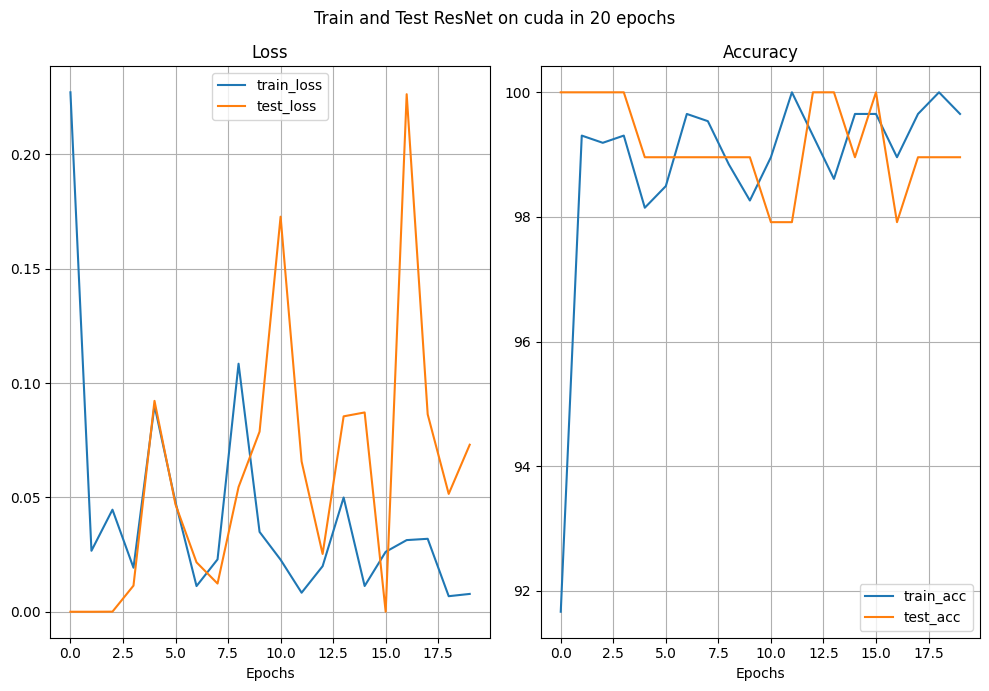

In [ ]:
plot_training_and_testing_results(result_resnet_model)

## Step 12: Save model

In [ ]:
save_path = root_path / 'models'
save_path.mkdir(parents=True, exist_ok=True)

In [ ]:
model_resnet50_path = save_path / 'resnet50_model.pth'
torch.save(model_resnet50.state_dict(), model_resnet50_path)

## Step 13: Evaluate model
- How much accuracy of model?
- How much big size of model?
- How long time to predict?

### Measuring time to predict and accuracy of model

In [ ]:
def make_predict(model, image, transform, device='cpu'):
  start_predict = timer()
  model.eval()
  transformed_image = transform(image).unsqueeze(0).to(device)
  model.to(device)
  with torch.inference_mode():
    y_pred = model(transformed_image)
    prob = torch.softmax(y_pred, dim=1)
    cls_to_idx = torch.argmax(prob, dim=1)
    prob = prob.max().cpu()
    class_name = train_data.classes[cls_to_idx]
  end_predict = timer()
  time_predict = end_predict - start_predict
  plt.figure(figsize=(6,6))
  plt.imshow(image)
  plt.title(f'Prediction: {class_name} | Probability: {prob}\n Time predict: {time_predict}')
  plt.axis('off')
  plt.show()
  return prob, time_predict

In [ ]:
import requests
from PIL import Image
def download_image(image_address, file_name):
    print(f'Downloading {file_name}...')
    request = requests.get(image_address)
    with open(file_name, 'wb') as f:
      f.write(request.content)
    print(f'Downloaded {file_name}')
    return Image.open(file_name).convert('RGB')

In [ ]:
image_1 = download_image(image_address='https://purepng.com/public/uploads/large/purepng.com-golden-applefoodsweettastyhealthyfruitapplegirl-981524680516epzoc.png', file_name='input_1.png')

Downloaded input_1.png


In [ ]:
image_2 = download_image(image_address='https://www.dalival.com/wp-content/uploads/2016/07/RED-DELICIOUS-SUPERCHIEF-LOGO-2.png', file_name='input_2.png')

Downloaded input_2.png


In [ ]:
image_3 = download_image('https://nargross.com/images/thumbs/0003247_elma-arjantin-kg_510.jpg', 'input_3.png')

Downloaded input_3.png


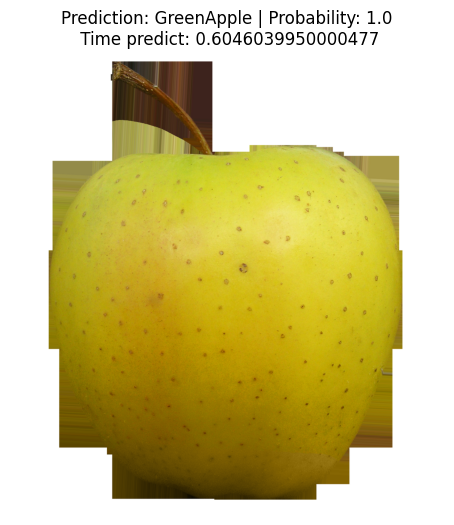

(tensor(1.), 0.6046039950000477)

In [ ]:
make_predict(model=model_resnet50, image=c, transform=transform)

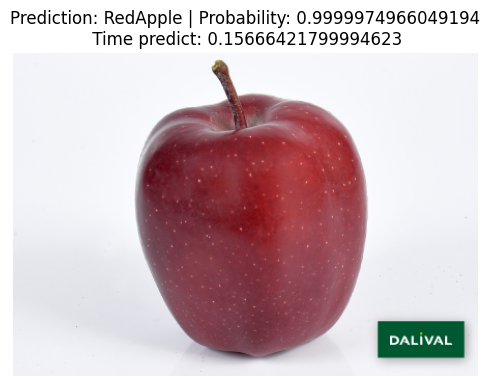

(tensor(1.0000), 0.15666421799994623)

In [ ]:
make_predict(model=model_resnet50, image=image_2, transform=transform)

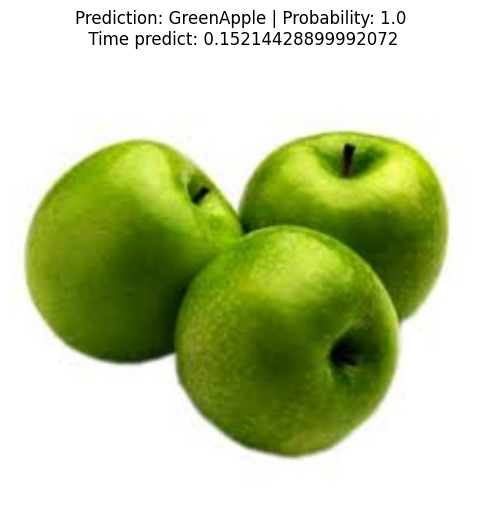

(tensor(1.), 0.15214428899992072)

In [ ]:
make_predict(model=model_resnet50, image=image_3, transform=transform)

In [ ]:
def make_predict_path(model, image_path, transform, device='cpu'):
  start_predict = timer()
  model.eval()
  image = Image.open(image_path).convert('RGB')
  # image = image.covert('RGB')
  transformed_image = transform(image).unsqueeze(0).to(device)
  model.to(device)
  with torch.inference_mode():
    y_pred = model(transformed_image)
    prob = torch.softmax(y_pred, dim=1)
    cls_to_idx = torch.argmax(prob, dim=1)
    prob = prob.max().cpu()
    class_name = train_data.classes[cls_to_idx]
  end_predict = timer()
  time_predict = end_predict - start_predict
  plt.figure(figsize=(6,6))
  plt.imshow(image)
  plt.title(f'Prediction: {class_name} | Probability: {prob}\n Time predict: {time_predict}')
  plt.axis('off')
  plt.show()
  return prob, time_predict

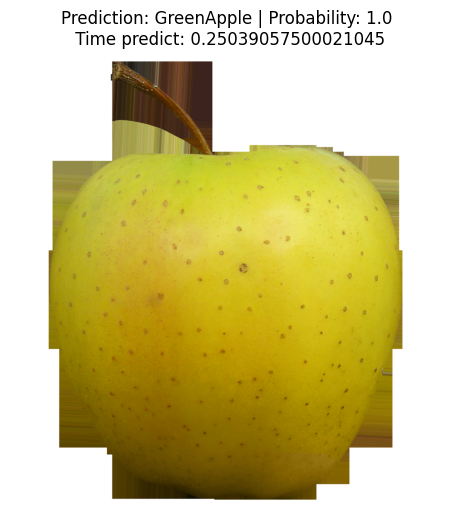

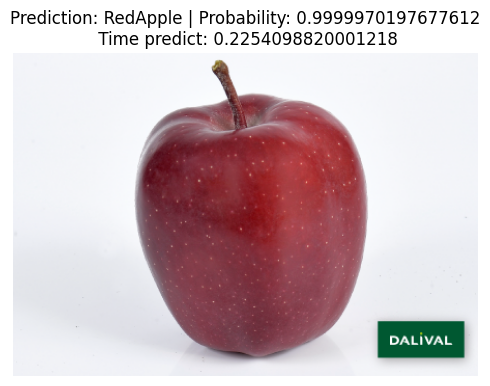

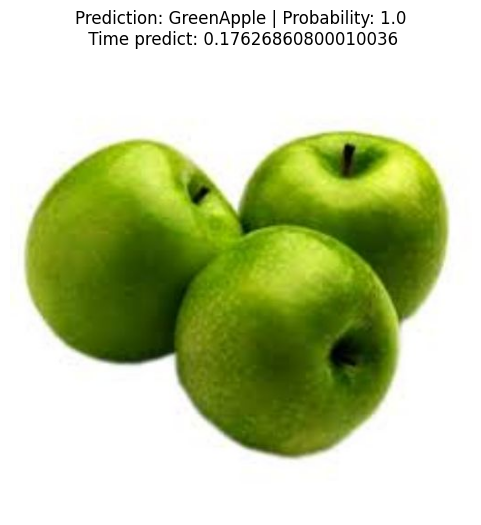

In [ ]:
predict_images = ['input_1.png', 'input_2.png', 'input_3.png']
probs, times = 0, 0
for i in predict_images:
  prob, time = make_predict_path(model=model_resnet50, image_path=i, transform=transform)
  probs += prob
  times += time
probs /= len(predict_images)
times /= len(predict_images)

In [ ]:
probs, times

(tensor(1.0000), 0.2173563550001442)

### Determine big size of model

In [ ]:
model_resnet50_path

PosixPath('/content/drive/MyDrive/Nghiên cứu khoa học/Apple-Varieties-classification/models/resnet50_model.pth')

In [ ]:
from pathlib import Path

restnet50_size = model_resnet50_path.stat().st_size// (1024*1024)
print(f"ResNet50 feature extractor model size: {restnet50_size} MB")

ResNet50 feature extractor model size: 89 MB


In [ ]:
import pandas as pd

resnet50_info = pd.DataFrame(
    {
    'Name': model_resnet50.__class__.__name__,
    'Accuracy testing (%)': [result_resnet_model['test_acc'][-1]],
    'Accuracy predict (%)': probs.item() * 100,
    'Time predict (s)': [times],
    'Size (MB)': [restnet50_size]
    }
)
resnet50_info

,Name,Accuracy testing (%),Accuracy predict (%),Time predict (s),Size (MB)
0,ResNet,98.958333,99.999905,0.217356,89


In [ ]:
resnet50_info.to_csv('/content/drive/MyDrive/Nghiên cứu khoa học/Apple-Varieties-classification/models/resnet50_info.csv', index=False)

## Step 14: Train with other models
- We can experiment some models such as: mobilenet_v2, resnet18

### ResNet18

In [ ]:
import torchvision.models as models
from torchinfo import summary

weights = models.ResNet18_Weights.DEFAULT
model_resnet18 = models.resnet18(weights=weights)
num_ftrs = model_resnet18.fc.in_features
model_resnet18.fc = torch.nn.Linear(num_ftrs, train_data.classes.__len__())
model_resnet18.to(device)
summary(model_resnet18, (32, 3, 256, 256))

Layer (type:depth-idx)                   Output Shape              Param #
ResNet                                   [32, 2]                   --
├─Conv2d: 1-1                            [32, 64, 128, 128]        9,408
├─BatchNorm2d: 1-2                       [32, 64, 128, 128]        128
├─ReLU: 1-3                              [32, 64, 128, 128]        --
├─MaxPool2d: 1-4                         [32, 64, 64, 64]          --
├─Sequential: 1-5                        [32, 64, 64, 64]          --
│    └─BasicBlock: 2-1                   [32, 64, 64, 64]          --
│    │    └─Conv2d: 3-1                  [32, 64, 64, 64]          36,864
│    │    └─BatchNorm2d: 3-2             [32, 64, 64, 64]          128
│    │    └─ReLU: 3-3                    [32, 64, 64, 64]          --
│    │    └─Conv2d: 3-4                  [32, 64, 64, 64]          36,864
│    │    └─BatchNorm2d: 3-5             [32, 64, 64, 64]          128
│    │    └─ReLU: 3-6                    [32, 64, 64, 64]          --
│

In [ ]:
next(model_resnet18.parameters()).device

device(type='cuda', index=0)

In [ ]:
# Train model resnet18
result_resnet18_model = train(model=model_resnet18,
                            train_dataloader=train_dataloader,
                            test_dataloader=test_dataloader,
                            epochs=8, lr=0.001, device=device)

 12%|█▎        | 1/8 [02:10<15:11, 130.21s/it]


Epoch: 0 | train_loss: 0.2832 | train_acc: 90.18% | test_loss: 4.1355 | test_acc: 82.59%


100%|██████████| 8/8 [03:34<00:00, 26.81s/it]


 Time train on ResNet on cuda is 214.46736214199996 seconds


In [ ]:
result_resnet18_model['train_loss'][-1], result_resnet18_model['test_loss'][-1]

(0.05433060571551323, 0.06059610722461782)

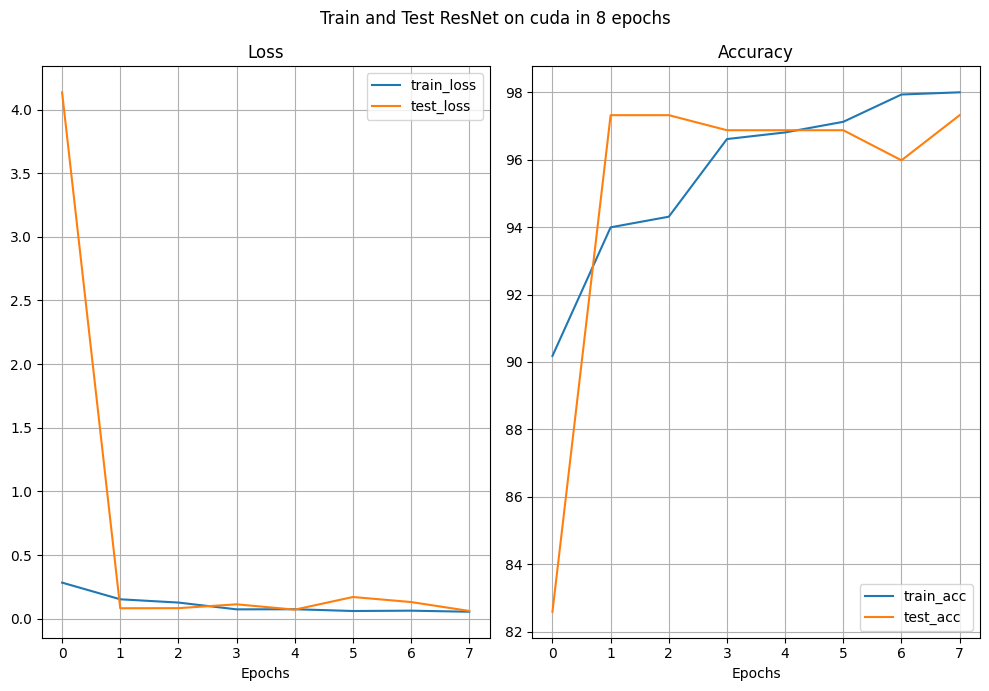

In [ ]:
# visualizate train and test processing
plot_training_and_testing_results(result_resnet18_model)

In [ ]:
# Make predict with resnet18 model
make_predict(model=model_resnet18, image=image, transform=transform)
make_predict(model=model_resnet18, image=image_3, transform=transform)

In [ ]:
# Save model resnet18
model_resnet18_path = save_path / 'resnet18_model.pth'
torch.save(model_resnet18.state_dict(), model_resnet18_path)

In [ ]:
# Evaluate model resnet18
predict_images = ['image_predicts/input_1.png', 'image_predicts/input_2.png', 'image_predicts/input_3.png', 'image_predicts/input_4.png']
probs, times = 0, 0
for i in predict_images:
  prob, time = make_predict_path(model=model_resnet18, image_path=i, transform=transform)
  probs += prob
  times += time
probs /= len(predict_images)
times /= len(predict_images)

In [ ]:
from pathlib import Path

restnet18_size = model_resnet18_path.stat().st_size // (1024*1024)
print(f"ResNet18 feature extractor model size: {restnet18_size} MB")

ResNet18 feature extractor model size: 42 MB


In [ ]:
result_resnet18_model['model_name']

'ResNet'

In [ ]:
import pandas as pd

resnet18_info = pd.DataFrame(
    {
    'Name': model_resnet18.__class__.__name__ + "18",
    'Accuracy testing (%)': [result_resnet18_model['test_acc'][-1]],
    'Accuracy predict (%)': probs.item() * 100,
    'Time predict (s)': [times],
    'Size (MB)': [restnet18_size]
    }
)
resnet18_info

,Name,Accuracy testing (%),Accuracy predict (%),Time predict (s),Size (MB)
0,ResNet18,97.321429,99.881893,0.178116,42


In [ ]:
resnet18_info.to_csv('models/resnet18_info.csv', index=False)

### mobilenet_v2

In [ ]:
import torchvision.models as models
from torchinfo import summary

weights = models.MobileNet_V2_Weights.DEFAULT
model_mobilenet_v2 = models.mobilenet_v2(weights=weights)
num_ftrs = model_mobilenet_v2.classifier[1].in_features
model_mobilenet_v2.classifier[1] = torch.nn.Linear(num_ftrs, train_data.classes.__len__())
model_mobilenet_v2.to(device)
summary(model_mobilenet_v2, (32, 3, 256, 256))

Downloading: "https://download.pytorch.org/models/mobilenet_v2-7ebf99e0.pth" to /root/.cache/torch/hub/checkpoints/mobilenet_v2-7ebf99e0.pth
100%|██████████| 13.6M/13.6M [00:00<00:00, 56.2MB/s]


Layer (type:depth-idx)                             Output Shape              Param #
MobileNetV2                                        [32, 2]                   --
├─Sequential: 1-1                                  [32, 1280, 8, 8]          --
│    └─Conv2dNormActivation: 2-1                   [32, 32, 128, 128]        --
│    │    └─Conv2d: 3-1                            [32, 32, 128, 128]        864
│    │    └─BatchNorm2d: 3-2                       [32, 32, 128, 128]        64
│    │    └─ReLU6: 3-3                             [32, 32, 128, 128]        --
│    └─InvertedResidual: 2-2                       [32, 16, 128, 128]        --
│    │    └─Sequential: 3-4                        [32, 16, 128, 128]        896
│    └─InvertedResidual: 2-3                       [32, 24, 64, 64]          --
│    │    └─Sequential: 3-5                        [32, 24, 64, 64]          5,136
│    └─InvertedResidual: 2-4                       [32, 24, 64, 64]          --
│    │    └─Sequential: 3-6   

In [ ]:
# Train model mobilenet_v2
result_mobilenet_v2_model = train(model=model_mobilenet_v2,
                            train_dataloader=train_dataloader,
                            test_dataloader=test_dataloader,
                            epochs=5, lr=0.001, device=device)

 20%|██        | 1/5 [00:24<01:36, 24.21s/it]


Epoch: 0 | train_loss: 0.2585 | train_acc: 91.32% | test_loss: 0.0549 | test_acc: 98.96%


100%|██████████| 5/5 [00:53<00:00, 10.73s/it]


 Time train on MobileNetV2 on cuda is 53.64047670499997 seconds


In [ ]:
result_mobilenet_v2_model['train_loss'][-1], result_mobilenet_v2_model['test_loss'][-1]

(0.004068370106526547, 0.1296936745432807)

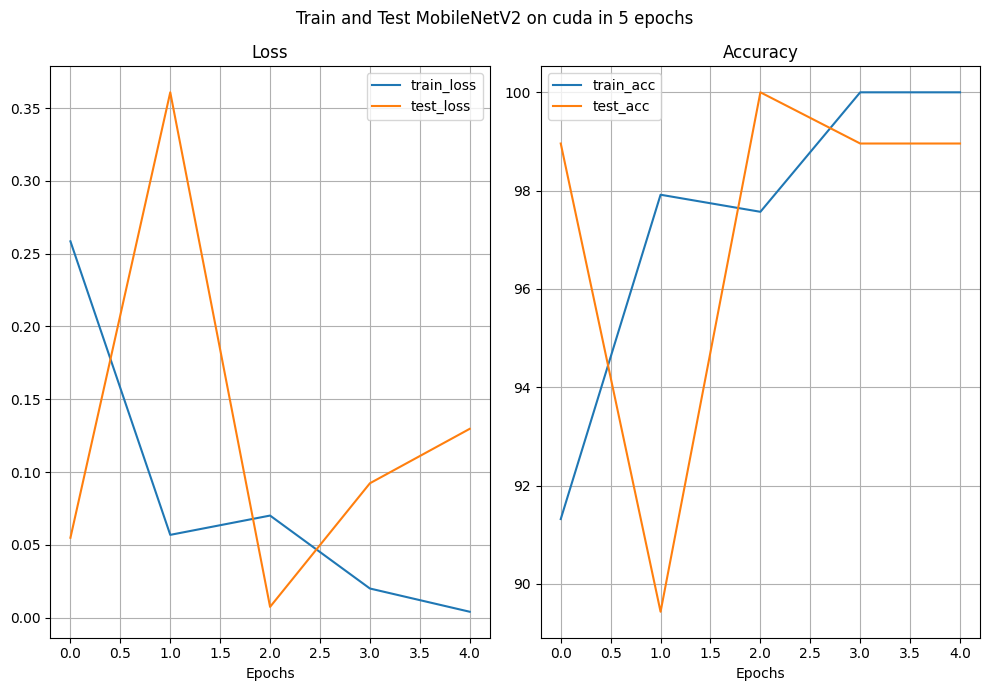

In [ ]:
# visualizate train and test processing
plot_training_and_testing_results(result_mobilenet_v2_model)

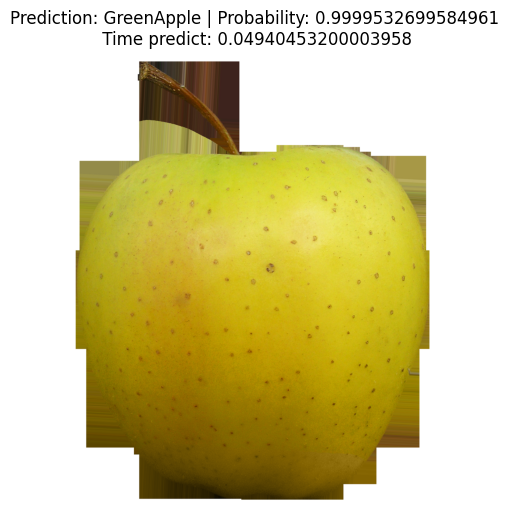

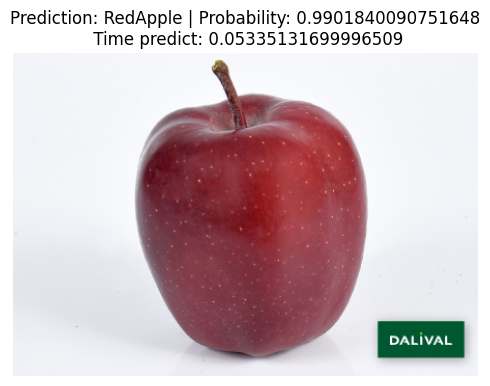

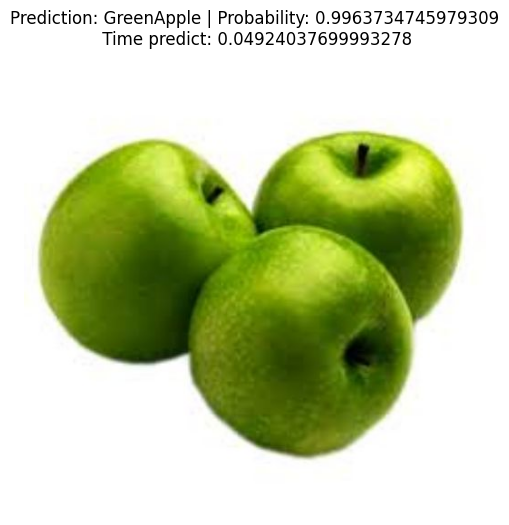

(tensor(0.9964), 0.04924037699993278)

In [ ]:
# Make predict with resnet18 model
make_predict(model=model_mobilenet_v2, image=image_1, transform=transform)
make_predict(model=model_mobilenet_v2, image=image_2, transform=transform)
make_predict(model=model_mobilenet_v2, image=image_3, transform=transform)

In [ ]:
# Save model resnet18
model_mobilenet_v2_path = save_path / 'mobilenet_v2_model.pth'
torch.save(model_mobilenet_v2.state_dict(), model_mobilenet_v2_path)

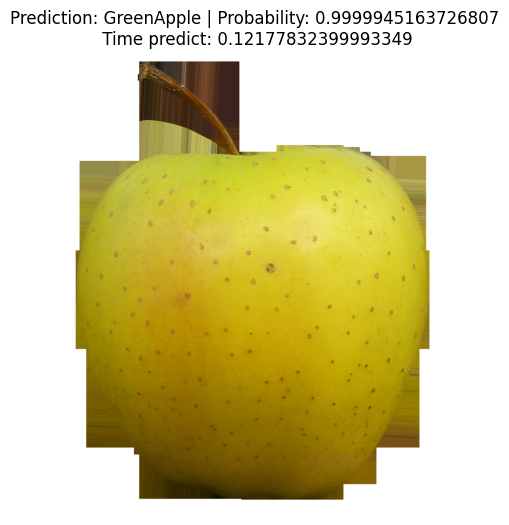

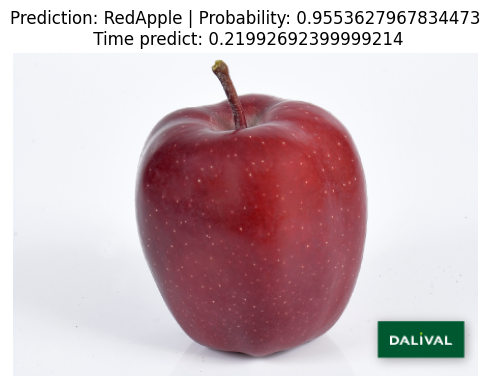

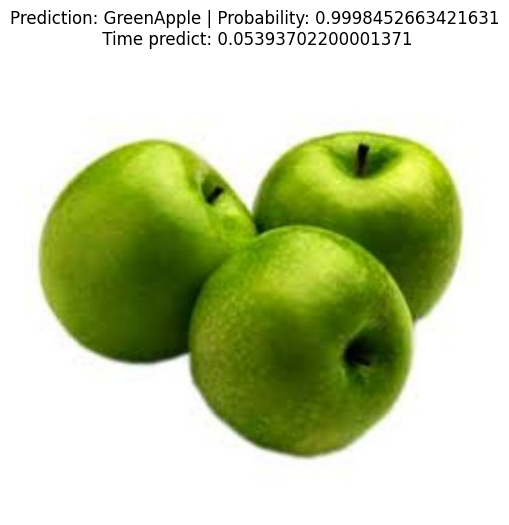

In [ ]:
# Evaluate model resnet18
predict_images = ['input_1.png', 'input_2.png', 'input_3.png']
probs, times = 0, 0
for i in predict_images:
  prob, time = make_predict_path(model=model_mobilenet_v2, image_path=i, transform=transform)
  probs += prob
  times += time
probs /= len(predict_images)
times /= len(predict_images)

In [ ]:
model_mobilenet_v2.__class__.__name__

'MobileNetV2'

In [ ]:
from pathlib import Path

mobilenet_v2_size = model_mobilenet_v2_path.stat().st_size // (1024*1024)
print(f"ResNet18 feature extractor model size: {mobilenet_v2_size} MB")

ResNet18 feature extractor model size: 8 MB


In [ ]:
import pandas as pd

mobilenet_v2_info = pd.DataFrame(
    {
    'Name': model_mobilenet_v2.__class__.__name__,
    'Accuracy testing (%)': [result_mobilenet_v2_model['test_acc'][-1]],
    'Accuracy predict (%)': probs.item() * 100,
    'Time predict (s)': [times],
    'Size (MB)': [mobilenet_v2_size]
    }
)
mobilenet_v2_info

,Name,Accuracy testing (%),Accuracy predict (%),Time predict (s),Size (MB)
0,MobileNetV2,98.958333,98.506755,0.131881,8


In [ ]:
models_info = pd.concat([resnet50_info, resnet18_info, mobilenet_v2_info], ignore_index=True)
models_info

In [ ]:
models_info.to_csv('models/models_info.csv', index=False)